<a href="https://colab.research.google.com/github/monikarav/sepsis-miniproject/blob/main/sepsi.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.impute import SimpleImputer
from sklearn.impute import KNNImputer
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import confusion_matrix, roc_auc_score, mean_absolute_error, mean_squared_error
import xgboost as xgb
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
import scipy.stats as stats


In [ ]:
combined = pd.read_csv('/content/Dataset.csv')

rows_to_drop = combined.loc[combined['Patient_ID'].apply(lambda x: len(str(x)) == 6)]
df_train = combined.drop(rows_to_drop.index)
df_train.to_csv('data_part1.csv', index=False)

rows_to_drop = combined.loc[combined['Patient_ID'].apply(lambda x: len(str(x)) != 6)]
df_test = combined.drop(rows_to_drop.index)
df_test.to_csv('data_part2.csv', index=False)

FileNotFoundError: [Errno 2] No such file or directory: '/content/Dataset.csv'

In [ ]:
df_train = pd.read_csv('data_part1.csv')
df_test = pd.read_csv('data_part2.csv')
df_train.head(15)


In [ ]:
df_train.columns

In [ ]:

patients = list(df_test['Patient_ID'].unique())
len(patients)

In [ ]:

def corr_matrix(df):
  corr = df.corr()
  mask = np.triu(np.ones_like(corr, dtype=bool))
  f, ax = plt.subplots(figsize=(40,40))
  cmap = sns.diverging_palette(220, 10, as_cmap=True)
  sns.heatmap(corr, mask=mask, cmap="Paired", vmax=.3, center=0,
              square=True, linewidths=.5, cbar_kws={"shrink": .5})


In [ ]:

null_values = df_train.isnull().mean()*100
null_values = null_values.sort_values(ascending=False)
null_values


,0
EtCO2,100.000000
TroponinI,99.925436
Bilirubin_direct,99.860192
Fibrinogen,99.338242
Bilirubin_total,98.685805
Alkalinephos,98.471433
AST,98.424830
Lactate,96.607326
Calcium,95.218567
Phosphate,95.050797


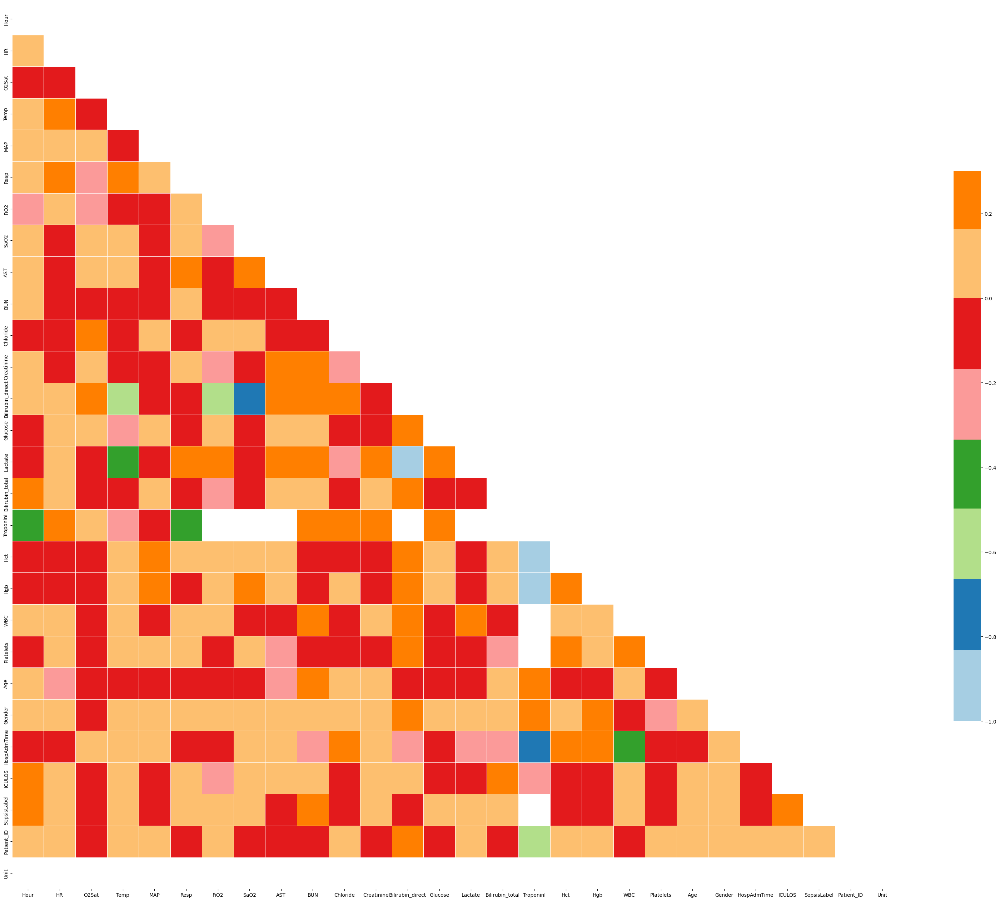

In [ ]:

columns_drop={'Unnamed: 0','SBP','DBP','EtCO2','BaseExcess', 'HCO3','pH','PaCO2','Alkalinephos', 'Calcium','Magnesium',
'Phosphate','Potassium','PTT','Fibrinogen','Unit1','Unit2'}
df_train = df_train.assign(Unit=df_train['Unit1'] + df_train['Unit2'])
df_train_mod = df_train.drop(columns=columns_drop)
df_train_mod.columns
corr_matrix(df_train_mod)


In [ ]:

df_train_impute = df_train_mod.copy()
columns_impute = list(df_train_impute.columns)

In [ ]:

grouped_by_patient = df_train_impute.groupby('Patient_ID')
df_train_impute = grouped_by_patient.apply(lambda x: x.bfill().ffill())
df_train_impute.head()


<ipython-input-15-c9838d52fcc0>:2: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_train_impute = grouped_by_patient.apply(lambda x: x.bfill().ffill())


Hour    HR  O2Sat   Temp   MAP  Resp  FiO2  SaO2  AST    BUN  \
Patient_ID                                                                      
2.0        4565     0  61.0   99.0  36.44  65.0  17.5   NaN   NaN  NaN  100.0   
           4566     1  61.0   99.0  36.44  65.0  17.5   NaN   NaN  NaN  100.0   
           4567     2  64.0   98.0  36.22  64.0  27.0   NaN   NaN  NaN  100.0   
           4568     3  56.0  100.0  36.22  65.0   9.0   NaN   NaN  NaN  100.0   
           4569     4  66.0   99.0  36.22  67.0  23.0   NaN   NaN  NaN  100.0   

                 ...  Hgb   WBC  Platelets    Age  Gender  HospAdmTime  \
Patient_ID       ...                                                     
2.0        4565  ...  9.7  11.0      158.0  75.91     0.0        -98.6   
           4566  ...  9.7  11.0      158.0  75.91     0.0        -98.6   
           4567  ...  9.7  11.0      158.0  75.91     0.0        -98.6   
           4568  ...  9.7  11.0      158.0  75.91     0.0        -98.6   
           4569  ...  9.7  11.0      158.0  75.91     0.0        -98.6   

                 ICULOS  SepsisLabel  Patient_ID  Unit  
Patient_ID                                              
2.0        4565     1.0          0.0         2.0   1.0  
           4566     2.0          0.0         2.0   1.0  
           4567     3.0          0.0         2.0   1.0  
           4568     4.0          0.0         2.0   1.0  
           4569     5.0          0.0         2.0   1.0  

[5 rows x 28 columns]

In [ ]:

null_values = df_train_impute.isnull().mean()*100
null_values = null_values.sort_values(ascending=False)
null_values

,0
TroponinI,98.331469
Bilirubin_direct,96.066368
Bilirubin_total,68.036913
AST,67.179344
Lactate,56.785981
SaO2,54.287845
Unit,47.073080
FiO2,35.728934
WBC,2.386279
Platelets,2.153244


In [ ]:

null_col = ['TroponinI', 'Bilirubin_direct', 'AST', 'Bilirubin_total', 'Lactate', 'SaO2', 'FiO2',
            'Unit', 'Patient_ID']
df_train_impute = df_train_impute.drop(columns=null_col)
df_train_impute.columns


Index(['Hour', 'HR', 'O2Sat', 'Temp', 'MAP', 'Resp', 'BUN', 'Chloride',
       'Creatinine', 'Glucose', 'Hct', 'Hgb', 'WBC', 'Platelets', 'Age',
       'Gender', 'HospAdmTime', 'ICULOS', 'SepsisLabel'],
      dtype='object')

In [ ]:

one_hot = pd.get_dummies(df_train_impute['Gender'])
df_train_impute = df_train_impute.join(one_hot)
df_train_impute = df_train_impute.drop('Gender', axis=1)


In [ ]:

def diagnostic_plots(df, variable):
    fig = plt.figure(figsize=(15,4))
    ax = fig.add_subplot(121)
    df[variable].hist(bins=30)
    ax = fig.add_subplot(122)
    stats.probplot(df[variable], dist="norm", plot=plt)
    plt.xlabel(variable)
    plt.show()

In [ ]:

def try_gaussian(df, col):
  print('actual plot')
  diagnostic_plots(df,col)
  # this applies yeojohnson plot
  df[col] = df[col].replace([np.inf, -np.inf], np.nan)  # Replace inf with NaN
  df[col] = df[col].fillna(df[col].mean()) # Replace NaN with column mean (choose another strategy if needed)

  df['col_yj'], param = stats.yeojohnson(df[col])
  print('yeojohnson plot')
  diagnostic_plots(df, 'col_yj')
  # this applies exponential transformation
  df['col_1.5'] = df[col]**(1/1.5)
  print('**1/1.5 plot')
  diagnostic_plots(df, 'col_1.5')
  df['col_.5'] = df[col]**(.5)
  print('**.5 plot')
  # this applies inverse transformation
  diagnostic_plots(df, 'col_.5')
  df['col_rec'] = 1 / (df[col]+0.00001)
  diagnostic_plots(df, 'col_rec')
  # this applies logarithmic trasnformation
  df['col_log'] = np.log(df[col]+1)
  diagnostic_plots(df, 'col_log')

O2Sat
actual plot


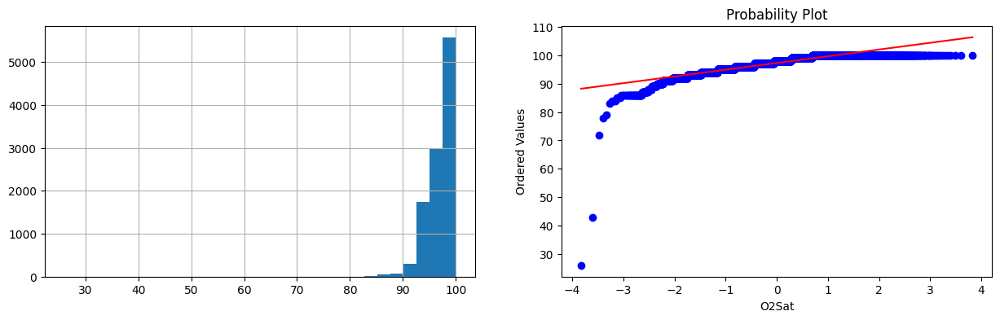

yeojohnson plot


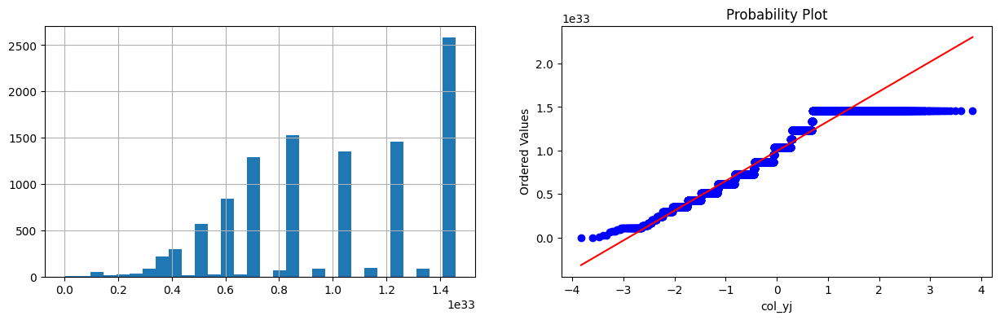

**1/1.5 plot


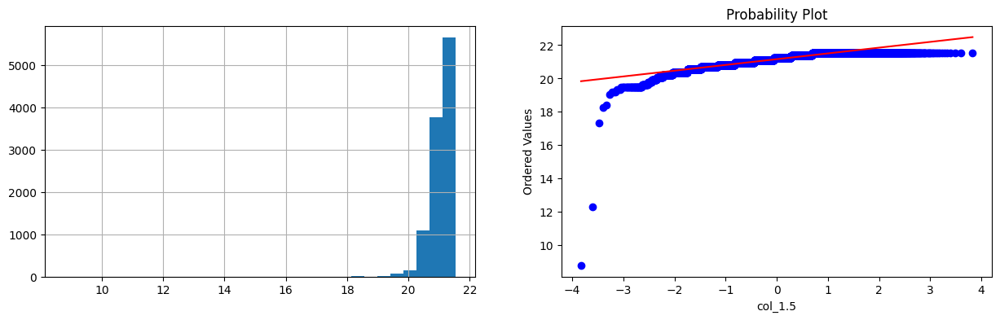

**.5 plot


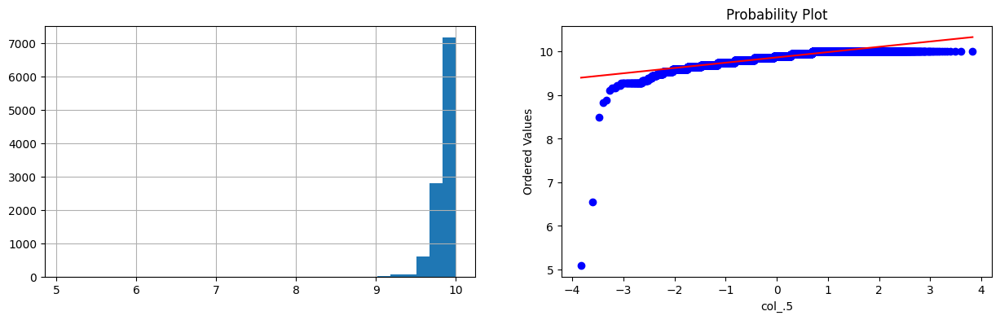

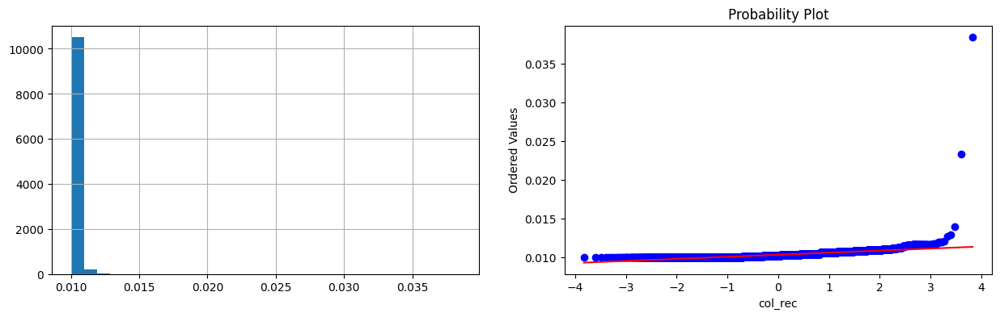

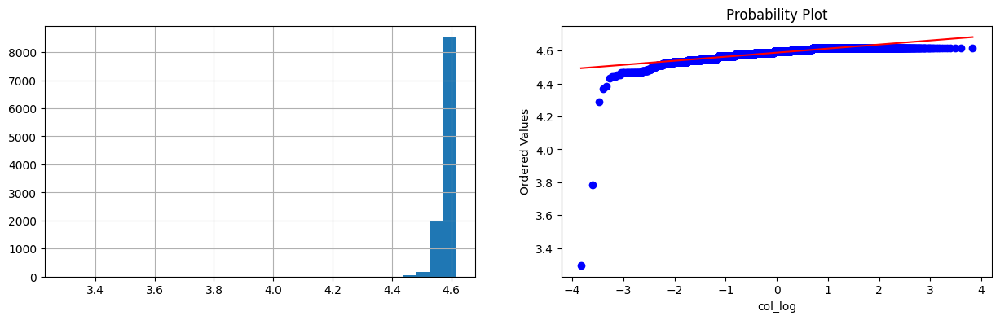

Temp
actual plot


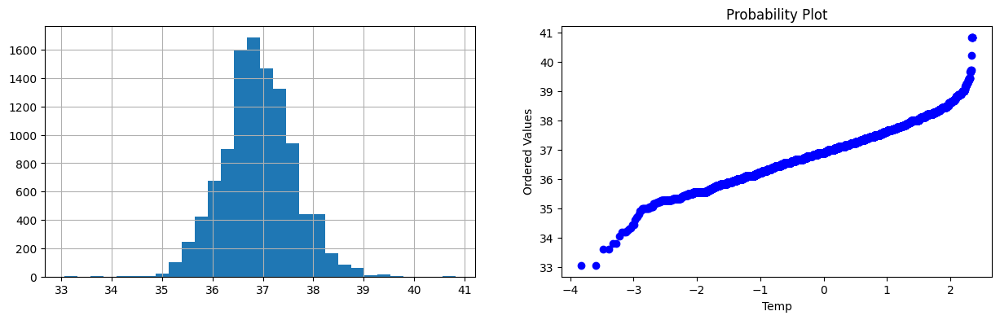

yeojohnson plot


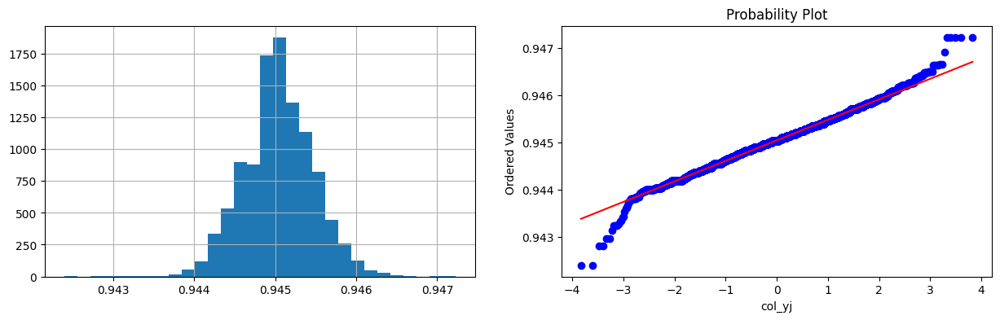

**1/1.5 plot


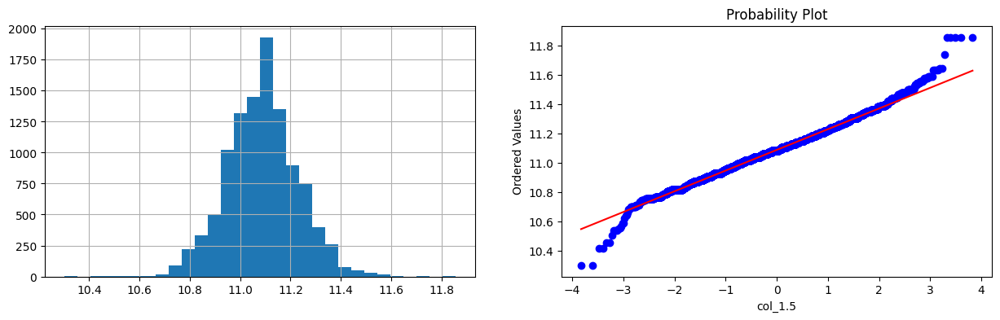

**.5 plot


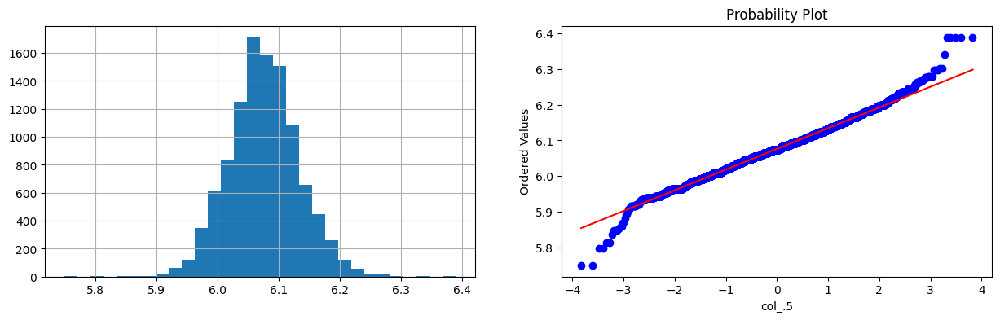

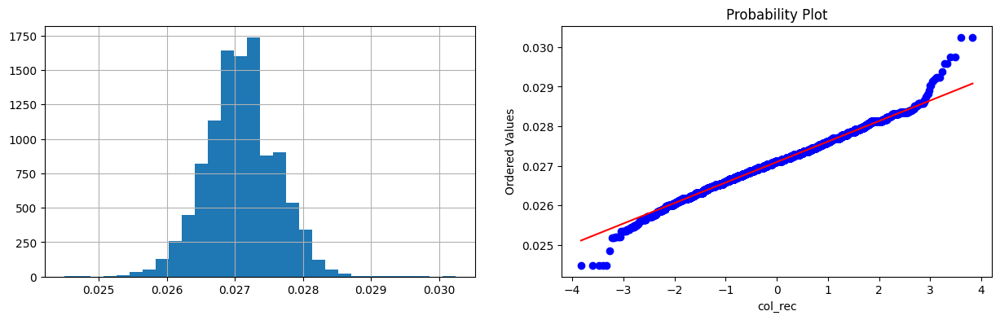

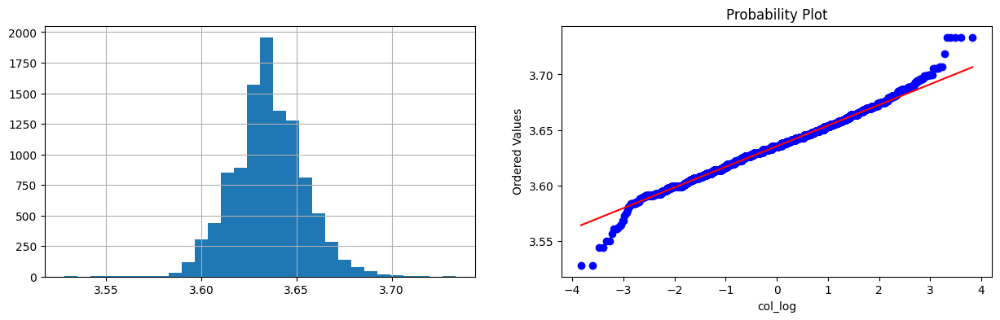

MAP
actual plot


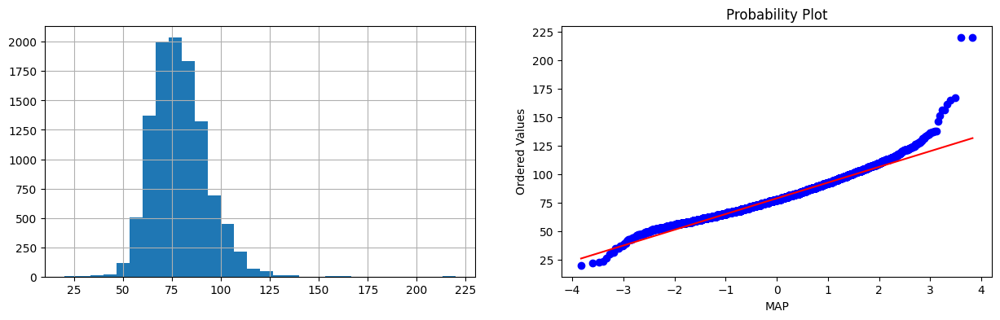

yeojohnson plot


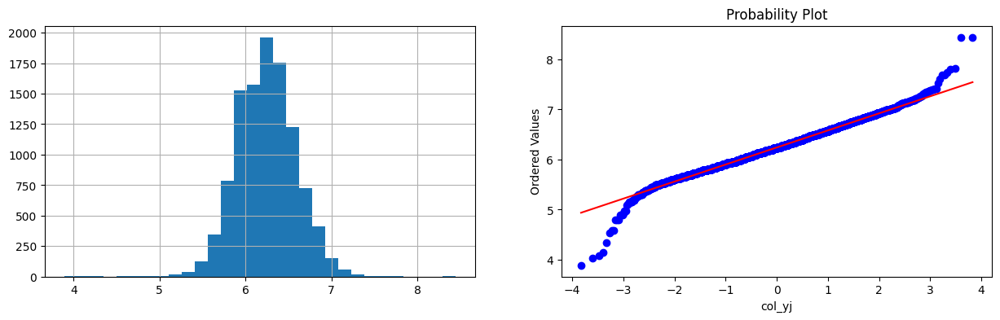

**1/1.5 plot


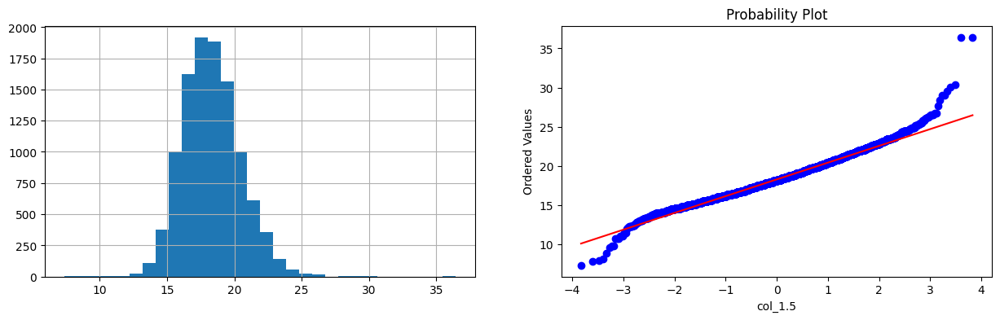

**.5 plot


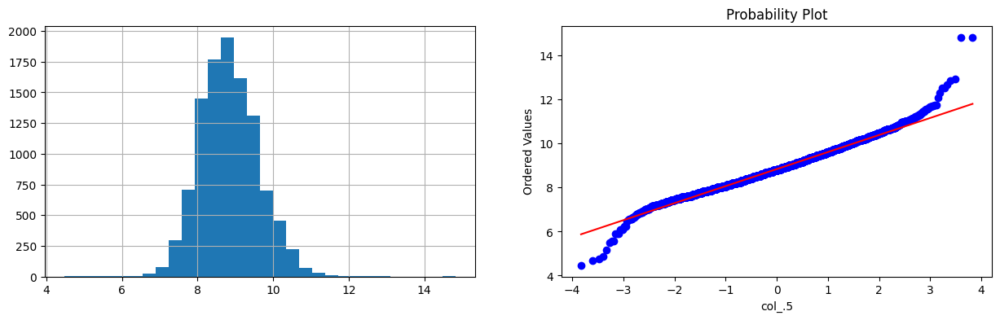

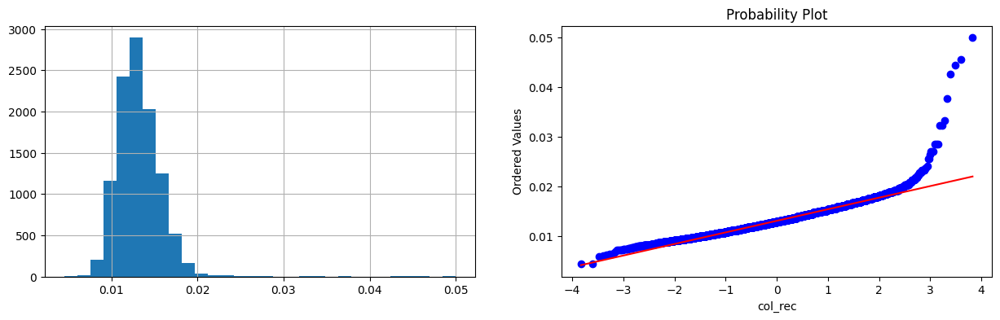

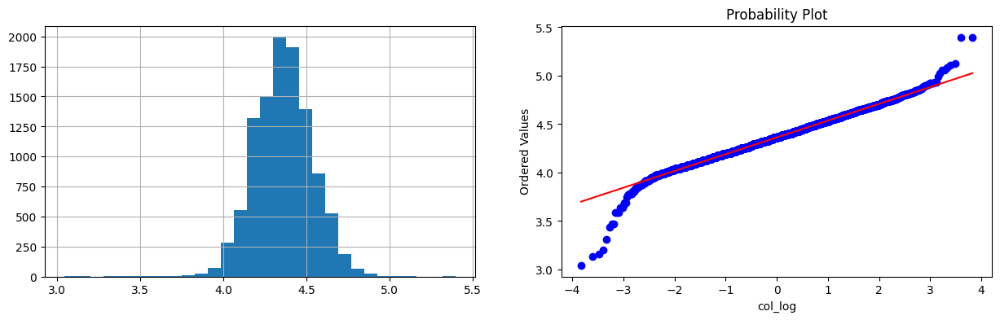

BUN
actual plot


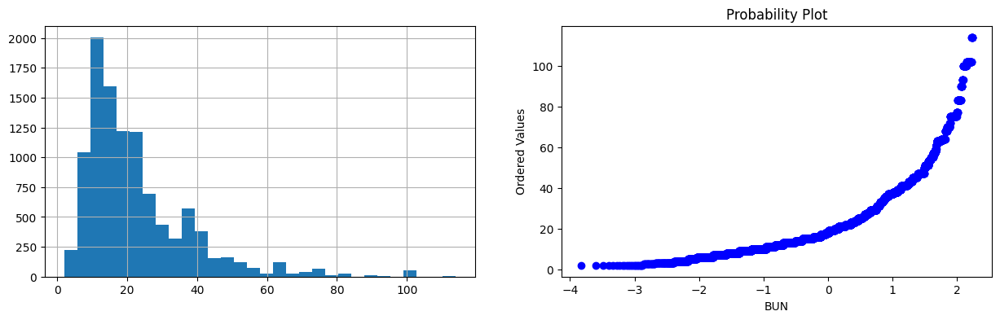

yeojohnson plot


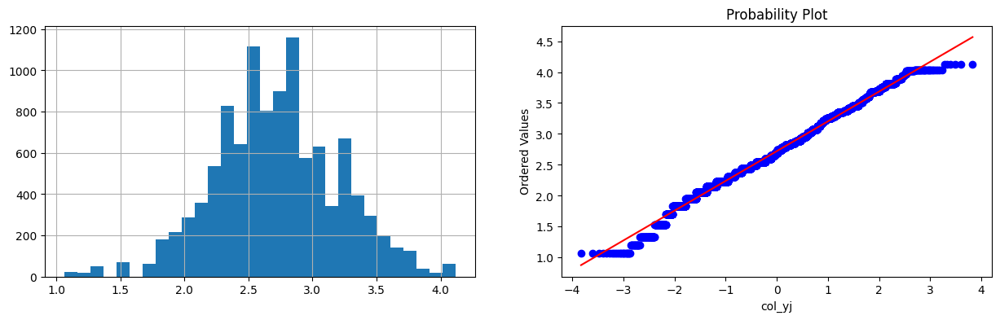

**1/1.5 plot


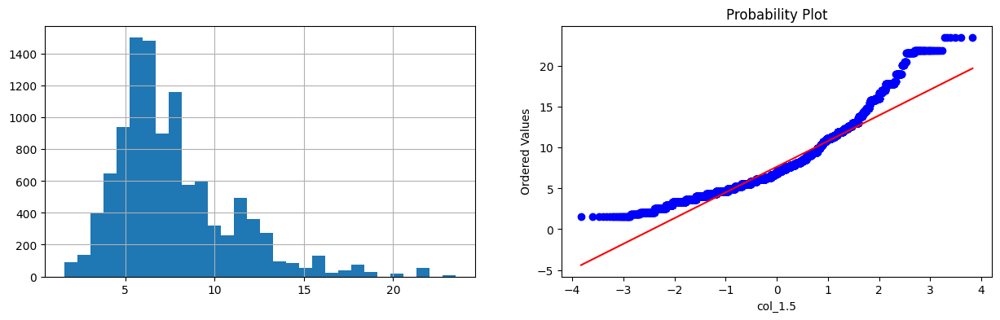

**.5 plot


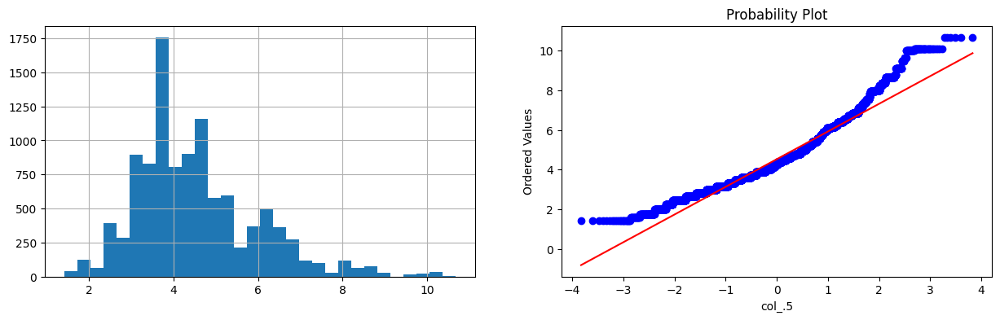

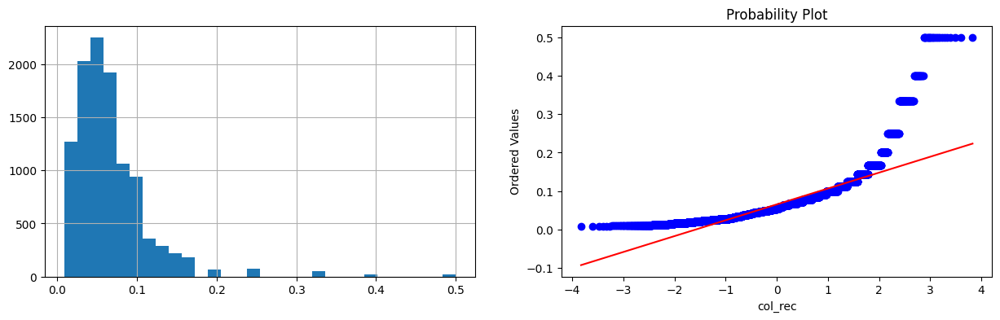

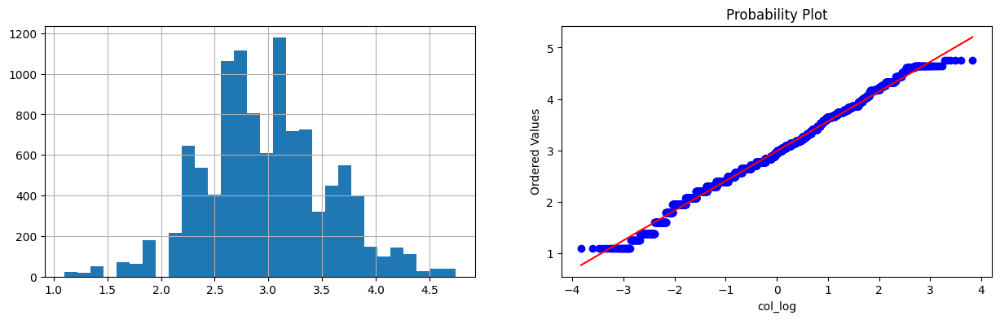

Creatinine
actual plot


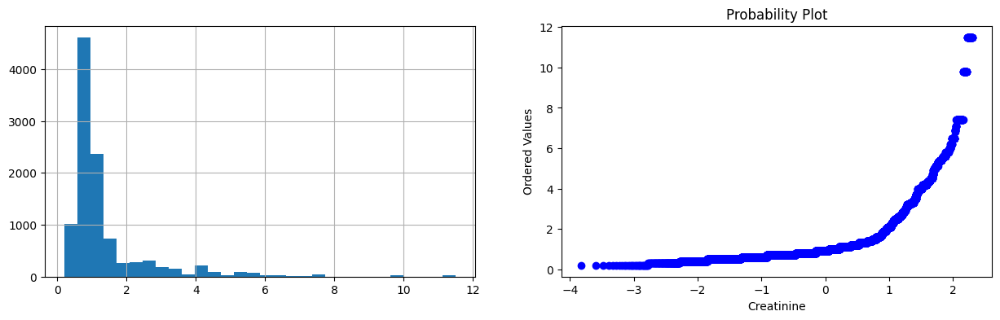

yeojohnson plot


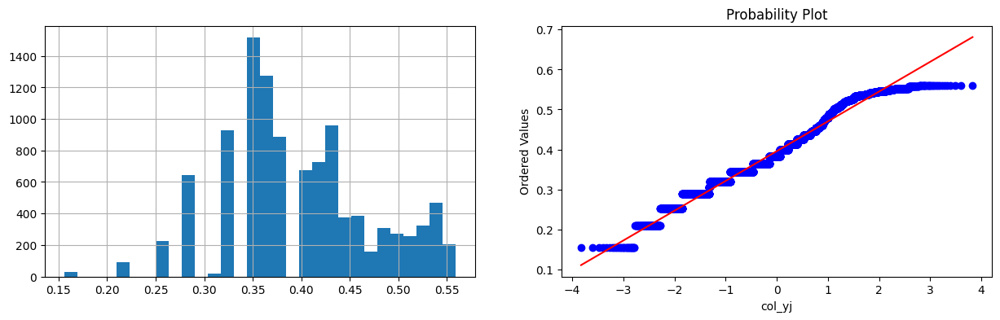

**1/1.5 plot


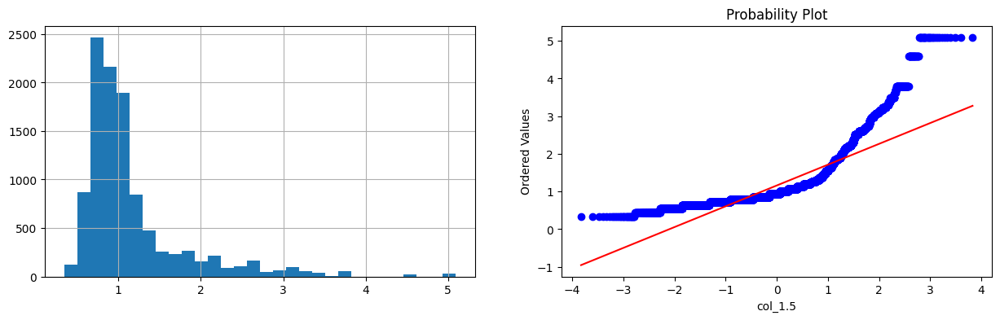

**.5 plot


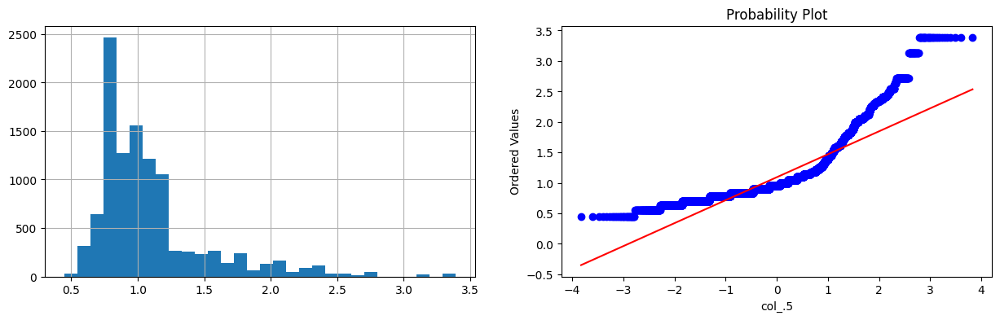

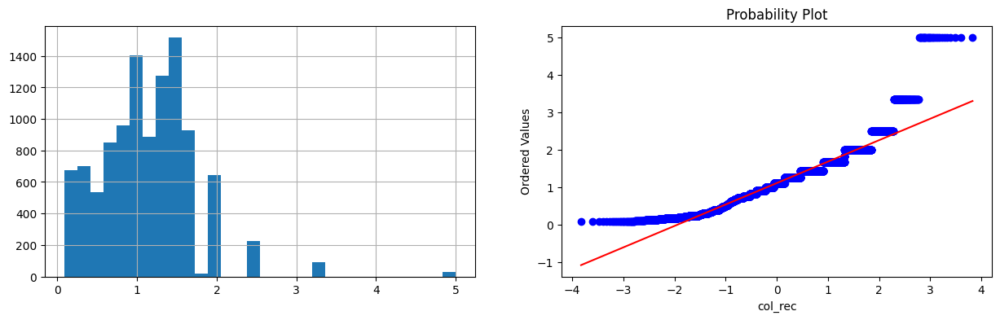

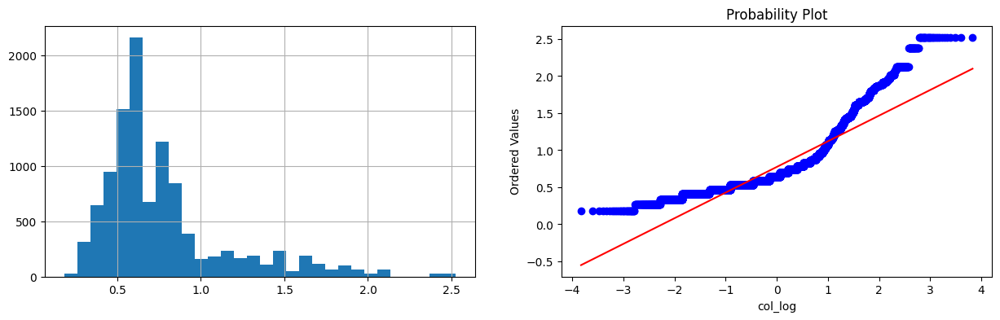

Glucose
actual plot


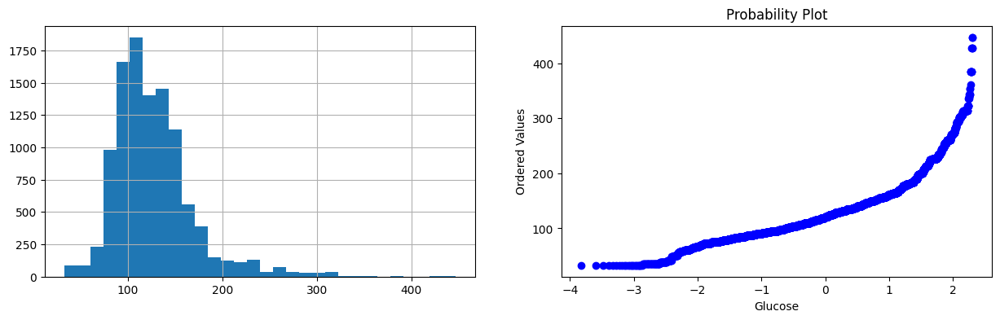

yeojohnson plot


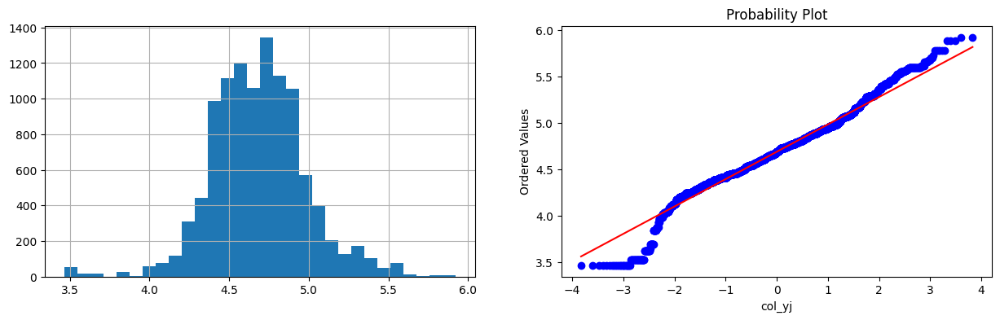

**1/1.5 plot


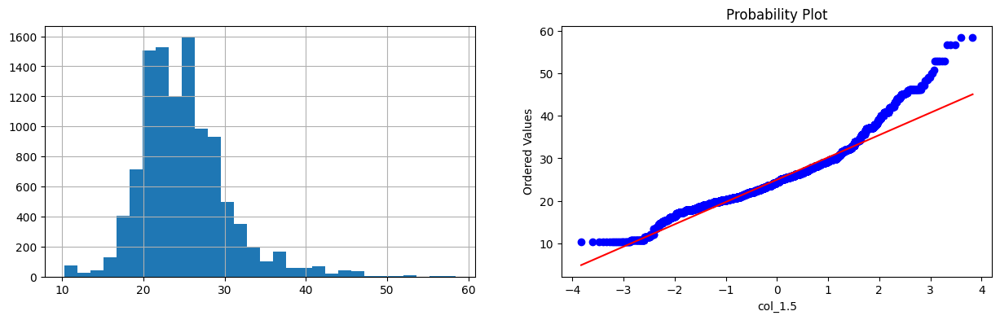

**.5 plot


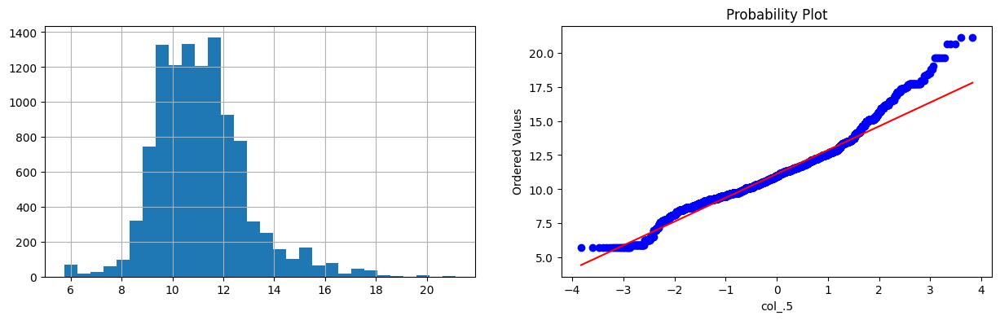

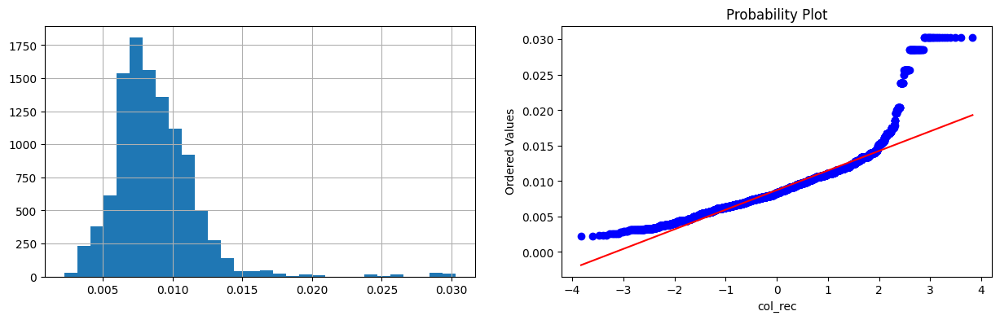

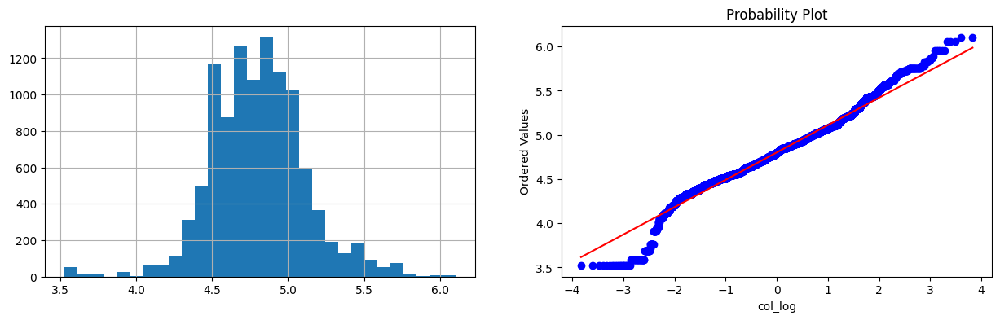

WBC
actual plot


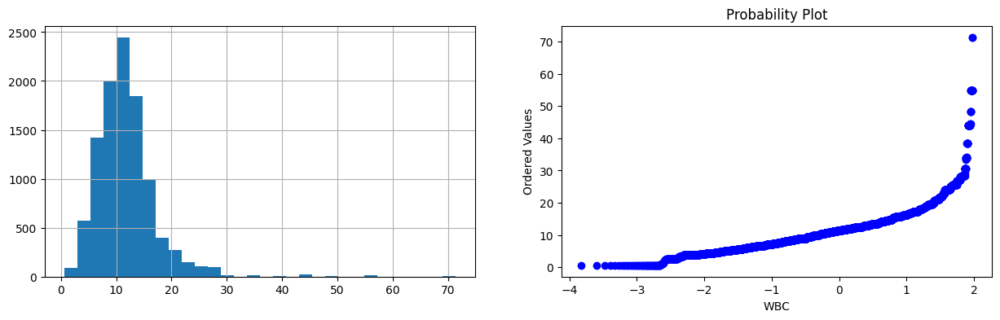

yeojohnson plot


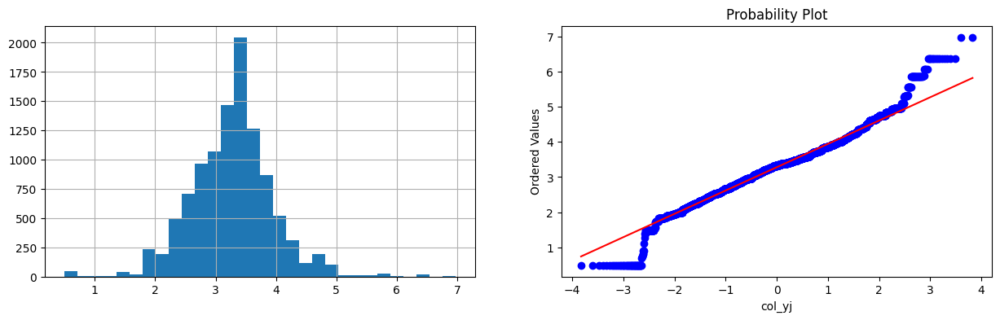

**1/1.5 plot


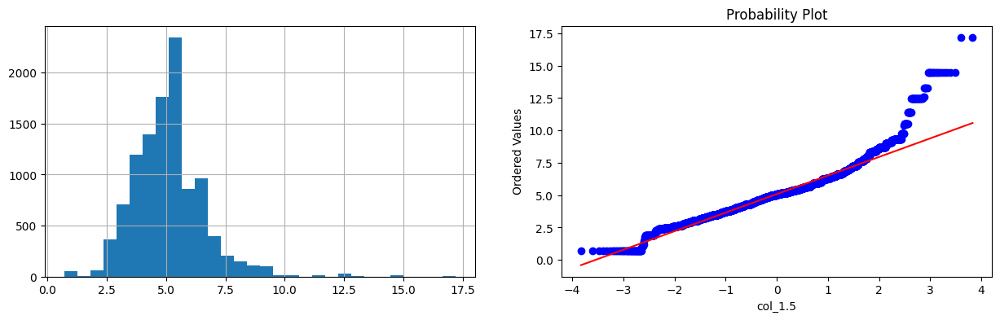

**.5 plot


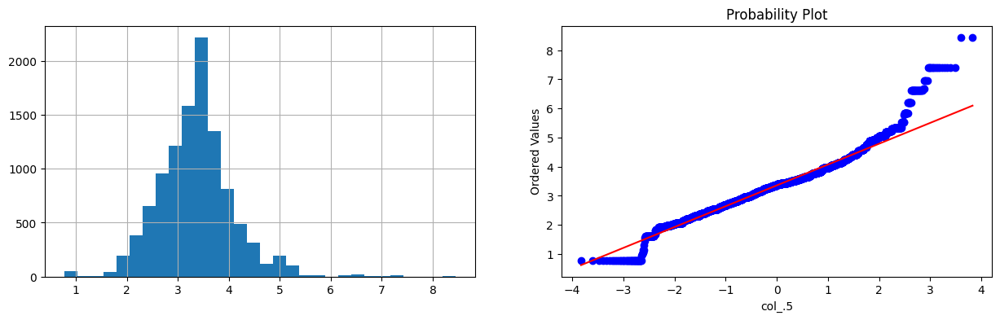

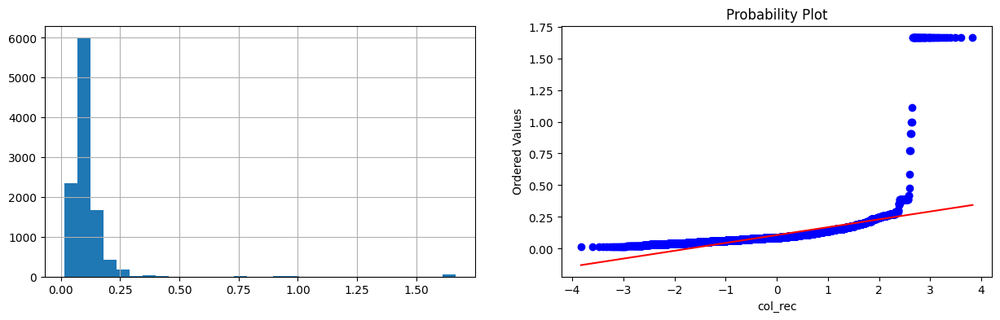

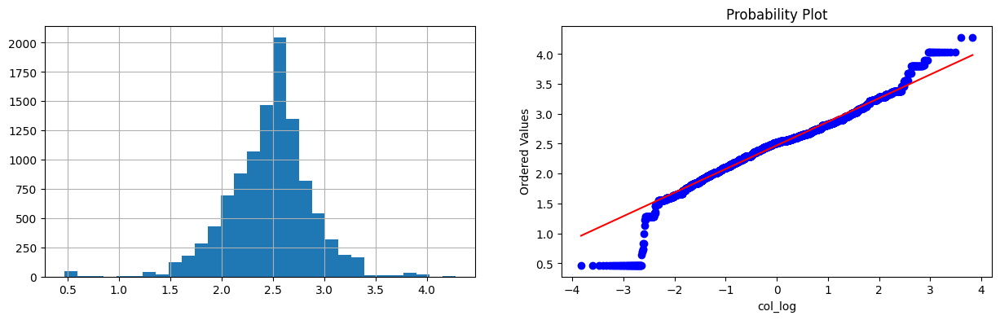

Platelets
actual plot


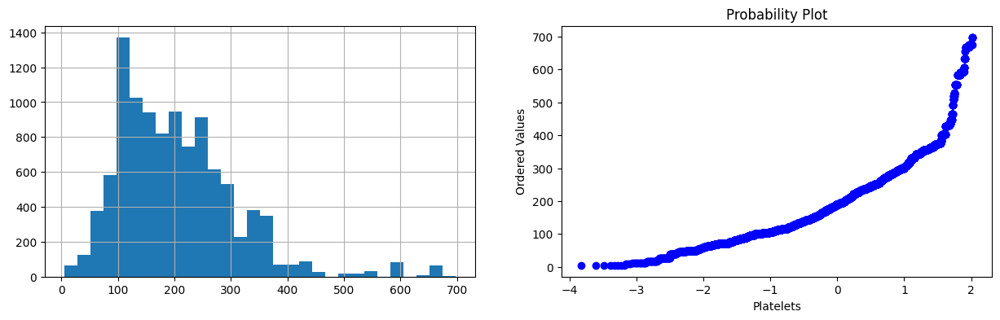

yeojohnson plot


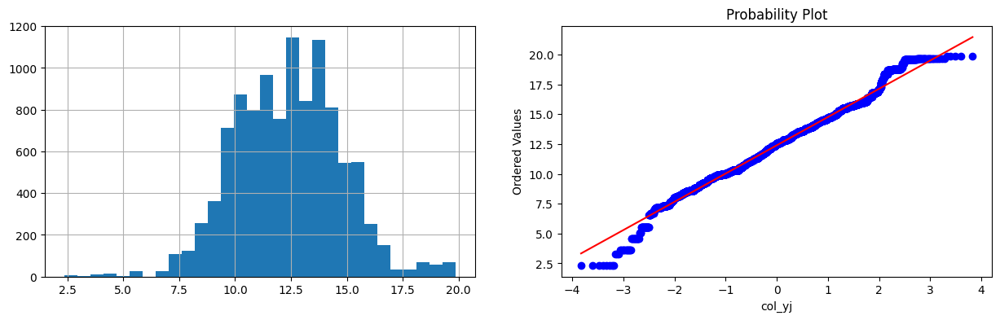

**1/1.5 plot


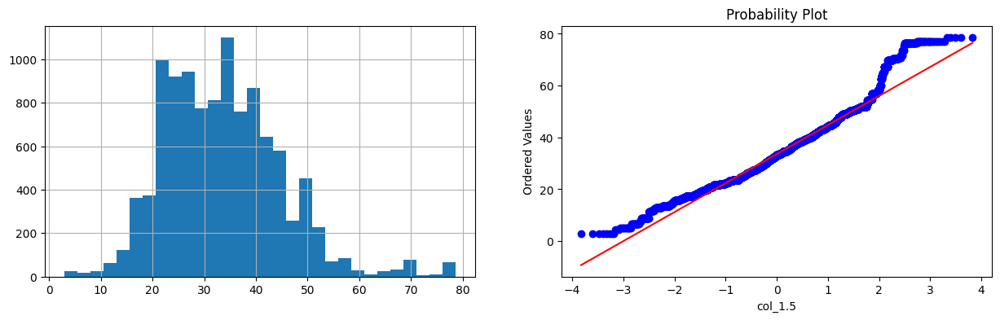

**.5 plot


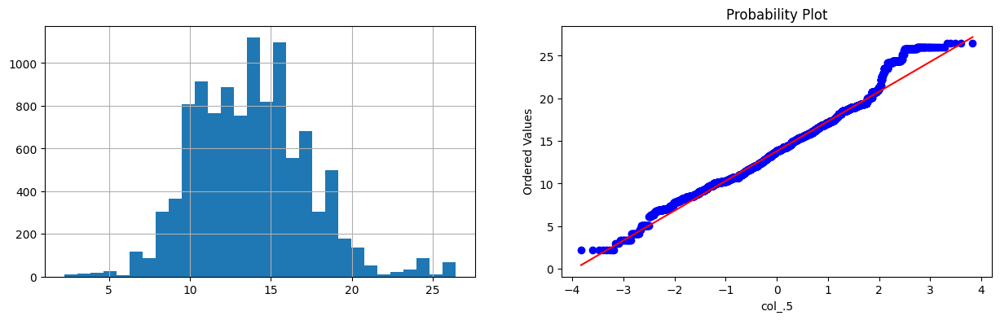

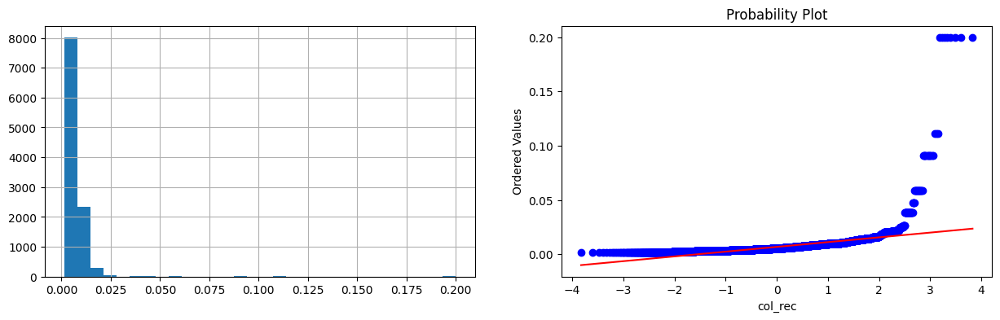

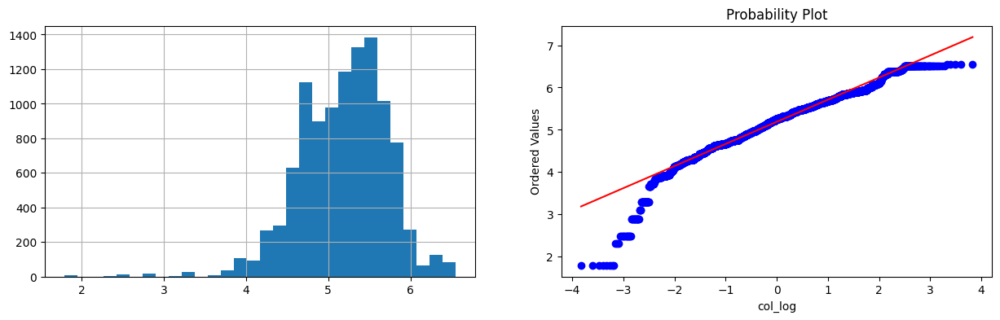

In [ ]:

lst = ['O2Sat', 'Temp', 'MAP', 'BUN', 'Creatinine', 'Glucose', 'WBC', 'Platelets' ]


for i in lst:
  print(i)
  try_gaussian(df_train_impute, i)


In [ ]:

df_train_impute = df_train_impute.drop(columns = ['col_yj','col_1.5','col_.5','col_rec','col_log'])
df_train_impute.head()


Hour    HR  O2Sat   Temp   MAP  Resp    BUN  Chloride  \
Patient_ID                                                               
2.0        4565     0  61.0   99.0  36.44  65.0  17.5  100.0     113.0   
           4566     1  61.0   99.0  36.44  65.0  17.5  100.0     113.0   
           4567     2  64.0   98.0  36.22  64.0  27.0  100.0     113.0   
           4568     3  56.0  100.0  36.22  65.0   9.0  100.0     113.0   
           4569     4  66.0   99.0  36.22  67.0  23.0  100.0     113.0   

                 Creatinine  Glucose   Hct  Hgb   WBC  Platelets    Age  \
Patient_ID                                                                
2.0        4565         2.5     78.0  27.8  9.7  11.0      158.0  75.91   
           4566         2.5     78.0  27.8  9.7  11.0      158.0  75.91   
           4567         2.5     78.0  27.8  9.7  11.0      158.0  75.91   
           4568         2.5     78.0  27.8  9.7  11.0      158.0  75.91   
           4569         2.5     78.0  27.8  9.7  11.0      158.0  75.91   

                 HospAdmTime  ICULOS  SepsisLabel   0.0    1.0  
Patient_ID                                                      
2.0        4565        -98.6     1.0          0.0  True  False  
           4566        -98.6     2.0          0.0  True  False  
           4567        -98.6     3.0          0.0  True  False  
           4568        -98.6     4.0          0.0  True  False  
           4569        -98.6     5.0          0.0  True  False

In [ ]:

columns_normalized = ['MAP', 'BUN', 'Creatinine', 'Glucose', 'WBC', 'Platelets' ]
for i in columns_normalized:
  df_train_impute[i] = np.log(df_train_impute[i]+1)

df_train_impute.head()


Hour    HR  O2Sat   Temp       MAP  Resp       BUN  Chloride  \
Patient_ID                                                                      
2.0        4565     0  61.0   99.0  36.44  4.189655  17.5  4.615121     113.0   
           4566     1  61.0   99.0  36.44  4.189655  17.5  4.615121     113.0   
           4567     2  64.0   98.0  36.22  4.174387  27.0  4.615121     113.0   
           4568     3  56.0  100.0  36.22  4.189655   9.0  4.615121     113.0   
           4569     4  66.0   99.0  36.22  4.219508  23.0  4.615121     113.0   

                 Creatinine   Glucose   Hct  Hgb       WBC  Platelets    Age  \
Patient_ID                                                                     
2.0        4565    1.252763  4.369448  27.8  9.7  2.484907   5.068904  75.91   
           4566    1.252763  4.369448  27.8  9.7  2.484907   5.068904  75.91   
           4567    1.252763  4.369448  27.8  9.7  2.484907   5.068904  75.91   
           4568    1.252763  4.369448  27.8  9.7  2.484907   5.068904  75.91   
           4569    1.252763  4.369448  27.8  9.7  2.484907   5.068904  75.91   

                 HospAdmTime  ICULOS  SepsisLabel   0.0    1.0  
Patient_ID                                                      
2.0        4565        -98.6     1.0          0.0  True  False  
           4566        -98.6     2.0          0.0  True  False  
           4567        -98.6     3.0          0.0  True  False  
           4568        -98.6     4.0          0.0  True  False  
           4569        -98.6     5.0          0.0  True  False

In [ ]:

scaler = StandardScaler()
df_train_impute[['HR', 'O2Sat', 'Temp', 'MAP', 'Resp', 'BUN', 'Chloride',
       'Creatinine', 'Glucose', 'Hct', 'Hgb', 'WBC', 'Platelets']] = scaler.fit_transform(df_train_impute[['HR', 'O2Sat', 'Temp', 'MAP', 'Resp', 'BUN', 'Chloride',
       'Creatinine', 'Glucose', 'Hct', 'Hgb', 'WBC', 'Platelets']])
df_train_impute.head()
df_train_impute = df_train_impute.dropna()

null_values = df_train_impute.isnull().mean()*100
null_values


,0
Hour,0.0
HR,0.0
O2Sat,0.0
Temp,0.0
MAP,0.0
Resp,0.0
BUN,0.0
Chloride,0.0
Creatinine,0.0
Glucose,0.0


In [ ]:
def get_data_ready(df):
  columns_drop={'Unnamed: 0','SBP','DBP','EtCO2','BaseExcess', 'HCO3','pH','PaCO2','Alkalinephos', 'Calcium','Magnesium',
  'Phosphate','Potassium','PTT','Fibrinogen','Unit1','Unit2'}
  df = df.assign(Unit=df['Unit1'] + df['Unit2'])
  # dropping columns based on redundancy
  df = df.drop(columns=columns_drop)
  grouped_by_patient = df.groupby('Patient_ID')
  # imputing backfill and forward fill
  df = grouped_by_patient.apply(lambda x: x.bfill().ffill())
  # dropping all the columns with null values more than 25% and patient_id
  null_col = ['TroponinI', 'Bilirubin_direct', 'AST', 'Bilirubin_total', 'Lactate', 'SaO2', 'FiO2','Unit', 'Patient_ID']
  df = df.drop(columns=null_col)
  # gaussian transformation
  columns_normalized = ['MAP', 'BUN', 'Creatinine', 'Glucose', 'WBC', 'Platelets' ]
  for i in columns_normalized:
    df[i] = np.log(df[i]+1)
  # normailizing
  scaler = StandardScaler()
  df[['HR', 'O2Sat', 'Temp', 'MAP', 'Resp', 'BUN', 'Chloride',
       'Creatinine', 'Glucose', 'Hct', 'Hgb', 'WBC', 'Platelets']] = scaler.fit_transform(df[['HR', 'O2Sat', 'Temp', 'MAP', 'Resp', 'BUN', 'Chloride',
       'Creatinine', 'Glucose', 'Hct', 'Hgb', 'WBC', 'Platelets']])
  # onehot encoding the gender
  one_hot = pd.get_dummies(df['Gender'])
  df = df.join(one_hot)
  df = df.drop('Gender', axis=1)
  df = df.dropna()
  return df
# this fucntion calculates different evaluation parameters of a model


In [ ]:

def evaluate_model(y_true,y_pred):
  accuracy = accuracy_score(y_true, y_pred)
  print("Accuracy:", accuracy)
  precision = precision_score(y_true, y_pred)
  print("Precision:", precision)
  recall = recall_score(y_true, y_pred)
  print("Recall:", recall)
  f1 = f1_score(y_true, y_pred)
  print("F1 Score:", f1)
  auc = roc_auc_score(y_true, y_pred)
  print("AUC-ROC:", auc)
  mae = mean_absolute_error(y_true, y_pred)
  print("Mean Absolute Error:", mae)
  rmse = np.sqrt(mean_squared_error(y_true, y_pred))
  print("Root Mean Squared Error:", rmse)
  cm = confusion_matrix(y_true, y_pred)
  sns.heatmap(cm, annot=True, fmt='d')
  plt.show()

In [ ]:
majority_class = df_train_impute[df_train_impute['SepsisLabel'] == 0]
minority_class = df_train_impute[df_train_impute['SepsisLabel'] == 1]
print('number of sepsis label 1 is {}'.format(len(minority_class)))
print('while number of sepsis label 0 is {}'.format(len(majority_class)))


number of sepsis label 1 is 260
while number of sepsis label 0 is 10248


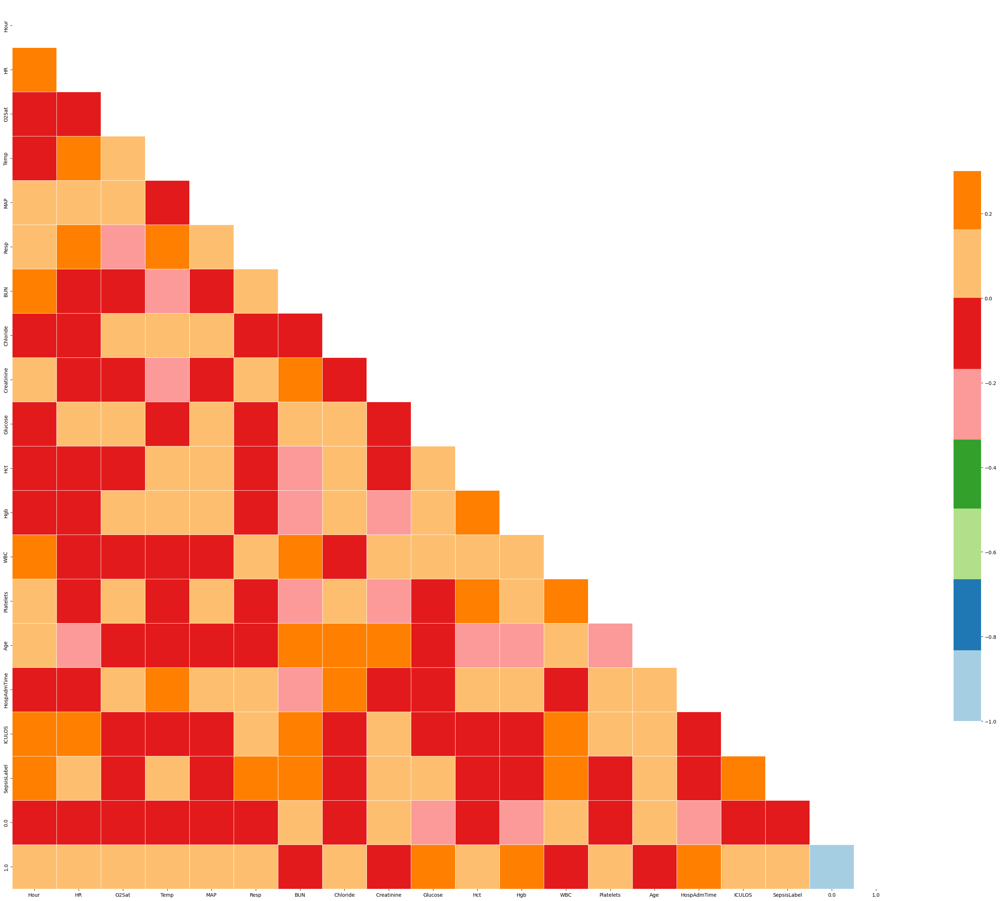

In [ ]:

majority_class_subset = majority_class.sample(n=2*len(minority_class))
df_train_impute = pd.concat([majority_class_subset, minority_class])

corr_matrix(df_train_impute)


In [ ]:
X = df_train_impute.drop('SepsisLabel', axis=1)
# Convert all column names to strings before splitting
X.columns = X.columns.astype(str)
y = df_train_impute['SepsisLabel']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)


Accuracy: 0.9807692307692307
Precision: 0.9444444444444444
Recall: 1.0
F1 Score: 0.9714285714285714
AUC-ROC: 0.9857142857142857
Mean Absolute Error: 0.019230769230769232
Root Mean Squared Error: 0.1386750490563073


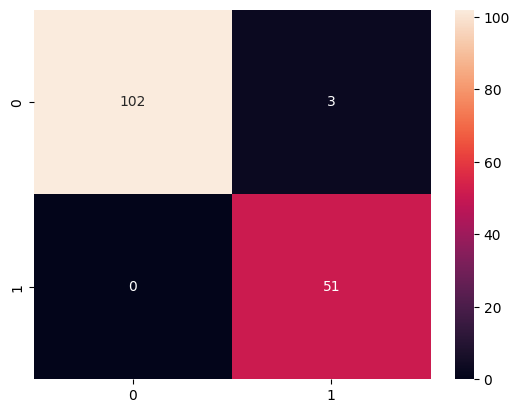

In [ ]:
# model = RandomForestClassifier(n_estimators=300, random_state=0)
# model.fit(X_train, y_train)
# rcf_predictions = model.predict(X_test)

# evaluate_model(y_test,rcf_predictions)


In [ ]:
pip install shap

Accuracy: 0.9615384615384616
Precision: 0.9464285714285714
Recall: 0.9464285714285714
F1 Score: 0.9464285714285714
AUC-ROC: 0.9582142857142857
Mean Absolute Error: 0.038461538461538464
Root Mean Squared Error: 0.19611613513818404


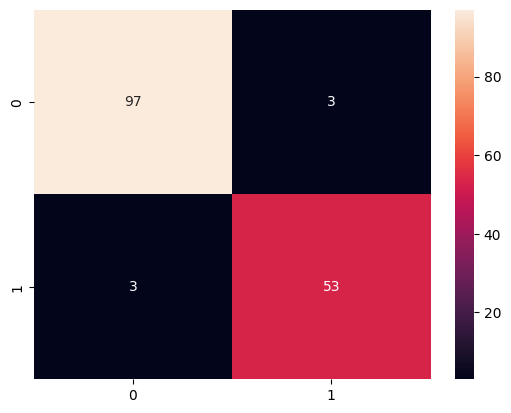

In [ ]:
rfc_model = RandomForestClassifier(n_estimators=300, random_state=0)
rfc_model.fit(X_train, y_train)
rcf_predictions = rfc_model.predict(X_test)

evaluate_model(y_test,rcf_predictions)



Accuracy: 0.7756410256410257
Precision: 0.8620689655172413
Recall: 0.44642857142857145
F1 Score: 0.5882352941176471
AUC-ROC: 0.7032142857142857
Mean Absolute Error: 0.22435897435897437
Root Mean Squared Error: 0.47366546671567095


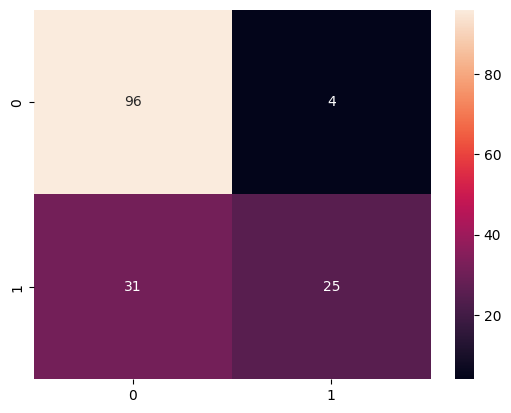

In [ ]:

from sklearn.naive_bayes import GaussianNB
gnb_model = GaussianNB()
gnb_model.fit(X_train, y_train)
nbc_predictions = gnb_model.predict(X_test)
evaluate_model(y_test,nbc_predictions)


Accuracy: 0.8525641025641025
Precision: 0.7796610169491526
Recall: 0.8214285714285714
F1 Score: 0.8
AUC-ROC: 0.8457142857142856
Mean Absolute Error: 0.14743589743589744
Root Mean Squared Error: 0.38397382389415224


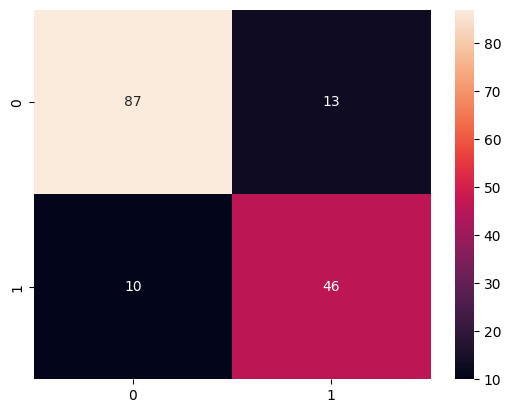

In [ ]:

from sklearn.neighbors import KNeighborsClassifier

knn_model = KNeighborsClassifier(n_neighbors=10)
knn_model.fit(X_train, y_train)
knn_predictions = knn_model.predict(X_test)
evaluate_model(y_test,knn_predictions)


Accuracy: 0.7628205128205128
Precision: 0.8275862068965517
Recall: 0.42857142857142855
F1 Score: 0.5647058823529412
AUC-ROC: 0.6892857142857143
Mean Absolute Error: 0.23717948717948717
Root Mean Squared Error: 0.48701076700570717


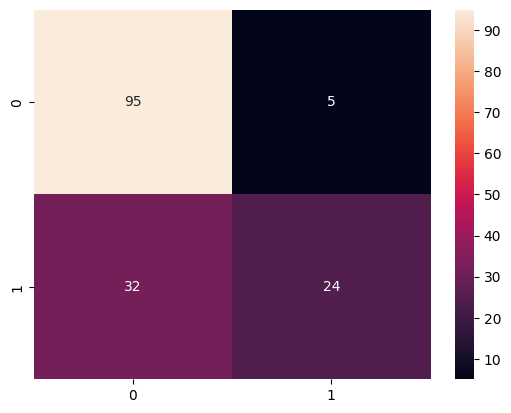

In [ ]:

from sklearn.linear_model import LogisticRegression
lg_model = LogisticRegression()
lg_model.fit(X_train, y_train)
lr_predictions = lg_model.predict(X_test)
evaluate_model(y_test,lr_predictions)




/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [08:17:41] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "silent" } are not used.

  warnings.warn(smsg, UserWarning)


Accuracy: 0.9743589743589743
Precision: 0.9272727272727272
Recall: 1.0
F1 Score: 0.9622641509433962
AUC-ROC: 0.980952380952381
Mean Absolute Error: 0.02564102564102564
Root Mean Squared Error: 0.16012815380508713


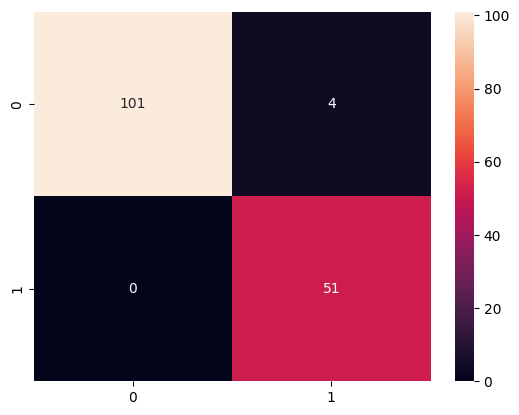

In [ ]:

import xgboost as xgb
dtrain = xgb.DMatrix(X_train, label=y_train)
dtest = xgb.DMatrix(X_test, label=y_test)
param = {
    'max_depth': 5,  # the maximum depth of each tree
    'eta': 0.3,  # the training step for each iteration
    'silent': 1,  # logging mode - quiet
    'objective': 'binary:logistic'}  # error evaluation for binary classification
num_round = 100
bst = xgb.train(param, dtrain, num_round)
xgb_predictions = bst.predict(dtest)
prediction = []
for i in xgb_predictions:
  if i<0.5:
    prediction.append(0)
  else:
    prediction.append(1)
evaluate_model(y_test,prediction)


In [ ]:
pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 4.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=72089b2eae5f3007f32be630ca9f96ebf6dc8ea27a5862e035936395218e5a85
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


Explanation for Random Forest


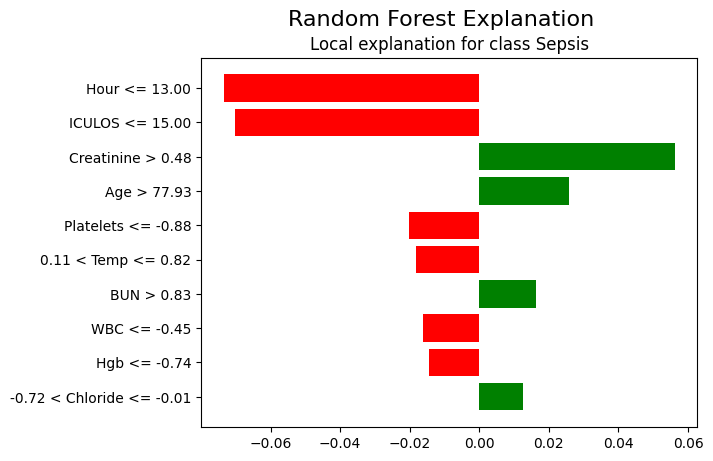


Explanation for K-Nearest Neighbors


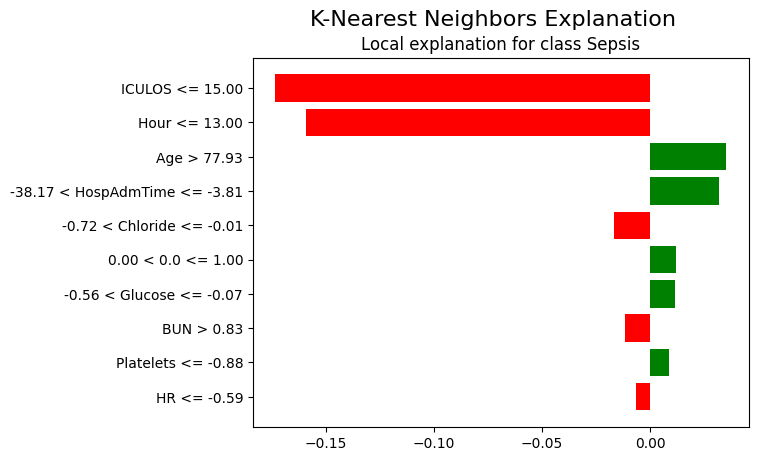


Explanation for Logistic Regression


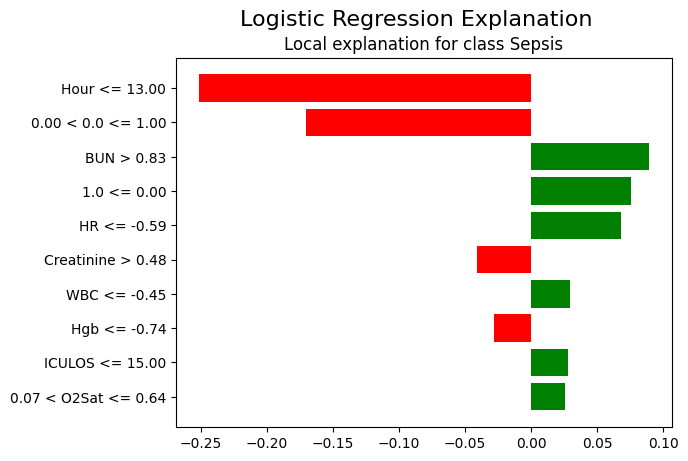


Explanation for GaussianNB


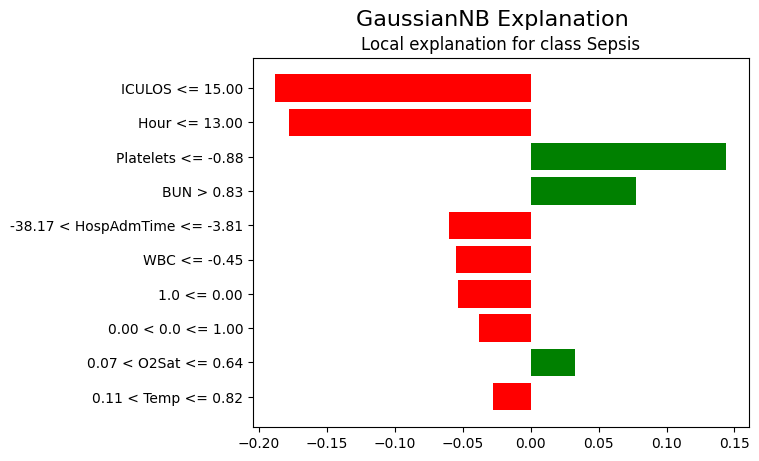

In [ ]:
import numpy as np
import lime
import lime.lime_tabular
import matplotlib.pyplot as plt
import warnings

# Suppress warnings to keep the output clean
warnings.filterwarnings("ignore")

instance_index = 4
instance = X_test.iloc[instance_index].values.reshape(1, -1)

# Create LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values,
                                                   feature_names=X_train.columns,
                                                   class_names=['No Sepsis', 'Sepsis'],
                                                   discretize_continuous=True)

# Explain the instance for each model
models = {'Random Forest': rfc_model, 'K-Nearest Neighbors': knn_model, 'Logistic Regression': lg_model, 'GaussianNB': gnb_model}

for model_name, model in models.items():
    print(f"Explanation for {model_name}")

    # Generate explanation
    explanation = explainer.explain_instance(instance[0], model.predict_proba, num_features=10)

    # Display explanation
    explanation.show_in_notebook(show_table=True, show_all=False)

    # Plot the explanation in a readable format
    fig = explanation.as_pyplot_figure()
    fig.suptitle(f"{model_name} Explanation", fontsize=16)
    plt.show()
    print()
